In [3]:

# Source - https://stackoverflow.com/a
# Posted by Bahri Mohamed Aziz
# Retrieved 2025-11-12, License - CC BY-SA 4.0

import pandas as pd    
jsonObj = pd.read_json(path_or_buf='/home/rtalwar/robot-imitation-glue/datasets/ground_resized/meta/episodes_stats.jsonl', lines=True)
jsonObj

,episode_index,stats
0,0,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
1,1,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
2,2,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
3,3,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
4,4,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
...,...,...
168,168,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
169,169,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
170,170,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."
171,171,"{'next.reward': {'min': [0.0], 'max': [0.0], '..."


In [4]:
for key , value  in jsonObj.stats[0].items():
    print(key)
    print(value["mean"])

next.reward
[0.0]
next.success
[0.0]
seed
[0.0]
timestamp
[6.85]
robot_pose
[-0.16794686019420602, -0.275276541709899, 0.220276951789855, 2.999645233154297, 0.026623122394084, -0.696935057640075]
gripper_state
[0.001108695636503]
joints
[0.602820932865142, -1.53212285041809, 1.10079801082611, -1.284511446952819, -1.56485104560852, -3.407845735549926]
ft
[-9.019396781921387, 0.06128029897809, -2.638875246047973, 0.25802206993103, -0.030356559902429, -0.013853390701115001]
btn_state
[0.927536249160766]
action
[0.6018522308356521, -1.528391901133717, 1.089407058567672, -1.275604390147803, -1.56304480286612, -3.409730073334514, 0.0]
frame_index
[68.5]
episode_index
[0.0]
index
[68.5]
task_index
[0.0]
observation.state
[0.602820932865142, -1.53212285041809, 1.10079801082611, -1.284511446952819, -1.56485104560852, -3.407845735549926, 0.0011086957529180001, 0.927536249160766]
observation.images.wrist_image
[[[0.40742236347664]], [[0.401522695015506]], [[0.35382909491921705]]]
observation.imag

In [3]:
import numpy as np
np.zeros(8,dtype=np.float32)

array([0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32)

In [ ]:
import cv2
import numpy as np

# convert tensor -> numpy image
img = cv2.imread("/home/rtalwar/robot-imitation-glue/image_comparison_logs/episode_0_20251113_120443/live_4.png")

# if your tensor values are 0–1, scale up for OpenCV
if img.max() <= 1.0:
    img = (img * 255).astype(np.uint8)
else:
    img = img.astype(np.uint8)

# OpenCV expects BGR, convert if you want to view colors correctly
img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

# save for inspection
cv2.imwrite("debug_live_image.png", img_bgr)
print("✅ Saved debug_live_image.png")

# optionally show directly
cv2.imshow("Live image", img_bgr)
cv2.waitKey(0)
cv2.destroyAllWindows()


✅ Saved debug_live_image.png


qt.qpa.xcb: QXcbConnection: XCB error: 148 (Unknown), sequence: 219, resource id: 0, major code: 140 (Unknown), minor code: 20


In [2]:
import cv2
import numpy as np

# convert tensor -> numpy image
img = cv2.imread("/home/rtalwar/robot-imitation-glue/image_comparison_logs/episode_0_20251113_120443/live_4.png")
img

array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 0],
        [1, 1, 1],
        [1, 1, 0]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 0],
        [1, 1, 1],
        [1, 1, 0]]], dtype=uint8)

In [1]:
from robot_imitation_glue.uR3station.robot_env import UR3eStation
import cv2
from robot_imitation_glue.uR3station.robot_env import UR3eStation
import rerun as rr

import torch
import numpy as np
from robot_imitation_glue.agents.lerobot_agent import LerobotAgent, make_lerobot_policy
import numpy as np
def preprocessor(obs_dict):
    spectogram_image = obs_dict["spectogram_image"]
    wrist_image = obs_dict["wrist_image"]
    state = obs_dict["state"]
    button = obs_dict["btn_state"]
    # state = np.concatenate((state,button))
    # state = np.zeros(state.shape, dtype=np.float32)

    image_size = 224
    resized_wrist_image = cv2.resize(
        np.array(wrist_image),
        (image_size, image_size),
        # interpolation=cv2.INTER_AREA,
    )
    resized_spectogram_image = cv2.resize(
        np.array(spectogram_image),
        (image_size, image_size),
        # interpolation=cv2.INTER_AREA,
    )

    state = torch.tensor(state).float().unsqueeze(0)
    spectogram_image = torch.tensor(resized_spectogram_image).float() / 255.0
    wrist_image = torch.tensor(resized_wrist_image).float() / 255.0
    spectogram_image = spectogram_image.permute(2, 0, 1)
    wrist_image = wrist_image.permute(2, 0, 1)

    # unsqueeze images
    spectogram_image = spectogram_image.unsqueeze(0)
    wrist_image = wrist_image.unsqueeze(0)

    return {
        "observation.images.spectogram_image": spectogram_image,
        "observation.images.wrist_image": wrist_image,
        "observation.state": state,
    }

if __name__ == "__main__":
    rr.init("robot_imitation_glue", spawn=True)
    checkpoint_path = "/home/rtalwar/robot-imitation-glue/outputs/train/2025-11-17/15-52-29_rgb_joints_no_instrumentation_bottom/checkpoints/last/pretrained_model"
    train_dataset_path = (
        "/home/rtalwar/robot-imitation-glue/datasets/rgb_joints_no_instrumentation_bottom_resized"
    )
    env = UR3eStation(with_instrumentation=True)
    observations = env.get_observations()
    policy = make_lerobot_policy(checkpoint_path, train_dataset_path)
    policy_agent = LerobotAgent(policy, "cuda", preprocessor)
    vis_image = observations["wrist_image"]
    rr.log("scene", rr.Image(vis_image))

    action, used_images, attn_maps= policy_agent.get_action(observations)
    # log images in rerun n_observations is hardcoded to 2 so 2 images should be shown
    if used_images is not None:
        # used_images shape: [batch, n_obs_steps, C, H, W]
        # assuming batch size 1:
        obs_imgs = used_images[0]          # shape [2, C, H, W]


        for i, img in enumerate(obs_imgs):
            # convert tensor → numpy and reshape to HWC
            img = img.squeeze(0)  # remove batch dim -> [C, H, W]

            img_np = img.cpu().numpy().transpose(1, 2, 0)

            rr.log(f"prediction_inputs/obs_{i}/raw", rr.Image(img_np))


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


2025-11-18 13:14:21.341 | INFO     | robot_imitation_glue.uR3station.robot_env:__init__:63 - Creating wrist camera publisher.
2025-11-18 13:14:21.358 | INFO     | robot_imitation_glue.uR3station.robot_env:__init__:72 - Creating wrist camera subscriber.
2025-11-18 13:14:21.434 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:22.436 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:23.437 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:24.439 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:25.441 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping fo

Shared memory file wrist_rgb.timestamp.buffer_0 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.timestamp.buffer_1 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.rgb.buffer_0 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.rgb.buffer_1 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.intrinsics.buffer_0 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.intrinsics.buffer_1 exists. Will unlink and re-create it.


2025-11-18 13:14:26.444 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:27.446 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:28.449 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:29.451 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:30.453 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:31.455 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Did not yet receive resolution message. Sleeping for 1s...
2025-11-18 13:14:32.457 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:99 - Di

Resolving data files:   0%|          | 0/86 [00:00<?, ?it/s]

Loading weights from local directory


2025-11-18 13:14:50.818 | INFO     | robot_imitation_glue.agents.lerobot_agent:get_action:59 - Lerobot agent observation preprocessor took 1.52 ms


kaas generating actions
kaas global conditionling
kaas rgb encoding per camera
[tensor([[[[0.1207, 0.1904, 0.0956,  ..., 0.1963, 0.1337, 0.0469],
          [0.0066, 0.0023, 0.0019,  ..., 0.0027, 0.0025, 0.0065],
          [0.0050, 0.0017, 0.0015,  ..., 0.0018, 0.0011, 0.0035],
          ...,
          [0.0024, 0.0037, 0.0010,  ..., 0.0011, 0.0018, 0.0012],
          [0.0033, 0.0010, 0.0005,  ..., 0.0006, 0.0013, 0.0013],
          [0.0018, 0.0004, 0.0003,  ..., 0.0010, 0.0008, 0.0015]],

         [[0.0028, 0.0041, 0.0052,  ..., 0.0032, 0.0047, 0.0046],
          [0.0055, 0.0049, 0.0099,  ..., 0.0287, 0.0045, 0.0048],
          [0.0067, 0.0102, 0.0524,  ..., 0.0729, 0.0039, 0.0026],
          ...,
          [0.0105, 0.0198, 0.0264,  ..., 0.0487, 0.0182, 0.0019],
          [0.0085, 0.0124, 0.0150,  ..., 0.0102, 0.0036, 0.0033],
          [0.0052, 0.0028, 0.0040,  ..., 0.0077, 0.0017, 0.0011]],

         [[0.0176, 0.0111, 0.0051,  ..., 0.0036, 0.0071, 0.0067],
          [0.0245, 0.0151, 0

2025-11-18 13:14:52.710 | INFO     | robot_imitation_glue.agents.lerobot_agent:get_action:65 - Lerobot agent inference took 1890.98 ms


In [ ]:
for i, img in enumerate(obs_imgs):
    # convert tensor → numpy and reshape to HWC
    img = img.squeeze(0)  # remove batch dim -> [C, H, W]

    img_np = img.cpu().numpy().transpose(1, 2, 0)


float32
float32


In [2]:

vis_image = observations["wrist_image"]
rr.log("scene", rr.Image(vis_image))


In [3]:
preprocessed_obs = preprocessor(observations)
vis_image = preprocessed_obs["observation.images.wrist_image"]
live_img = vis_image
live_img_np = (
                live_img.squeeze(0)  # remove batch dim -> [3, 224, 224]
                .permute(1, 2, 0)  # to [224, 224, 3]
                .cpu()
                .numpy()
            )
rr.log(f"prediction_inputs/preprocessed", rr.Image(live_img_np))


In [52]:
import torch
import numpy as np
import cv2

def overlay_all_keypoints(image_tensor, attn_tensor, alpha=0.5):
    """
    image_tensor: (C, H, W) torch tensor, values 0–1 or 0–255
    attn_tensor:  (K, h, w) torch tensor, typically (32,7,7)
    alpha: overlay transparency
    """

    # Convert image to uint8
    image_tensor = image_tensor.squeeze(0) 
    image = image_tensor.permute(1, 2, 0).cpu().numpy()  # (H, W, C)
    # if image.max() <= 1.0:
    #     image = (image * 255).astype(np.uint8)
    # else:
    #     image = image.astype(np.uint8)

    H_img, W_img = image.shape[:2]

    # Upsample all heatmaps at once
    heat = 1-attn_tensor.unsqueeze(0)  # (1, K, 7, 7)
    # heat = attn_tens|or
    heat_upsampled = torch.nn.functional.interpolate(
        heat, size=(H_img, W_img), mode='bilinear', align_corners=False
    )[0]  # (K, H, W)

    # Combine all into one heatmap by summing
    combined = heat_upsampled.sum(dim=0).cpu().numpy()  # (H, W)

    # Normalize to 0–255
    combined_norm = (combined - combined.min()) / (combined.max() - combined.min() + 1e-6)
    combined_uint8 = (combined_norm * 255).astype(np.uint8)

    # Colorize using a heatmap (JET)
    combined_color = (cv2.applyColorMap(combined_uint8, cv2.COLORMAP_JET)/255.0).astype(np.float32)

    # Overlay the heatmap onto the RGB image
    overlay = cv2.addWeighted(image, 1 - alpha, combined_color, alpha, 0)

    return image,overlay, combined_uint8, combined_color


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


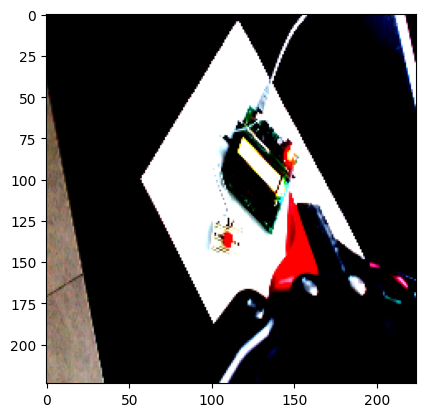

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


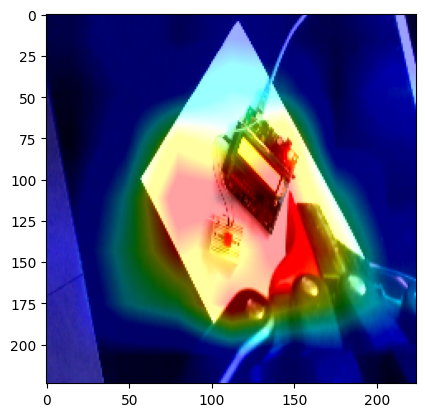

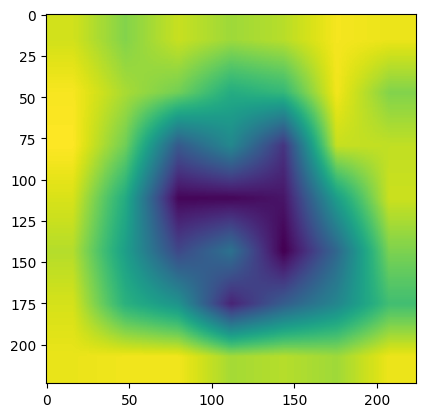

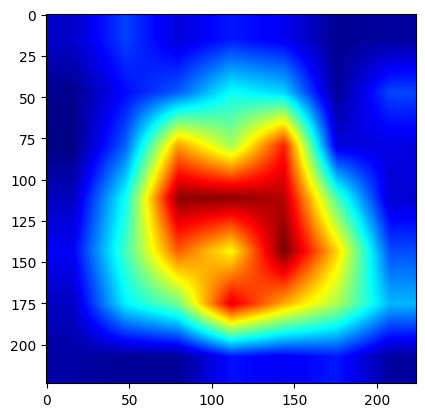

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


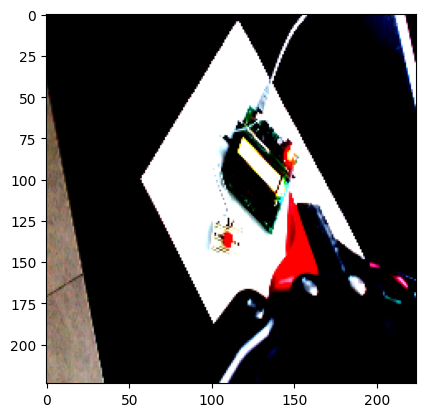

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


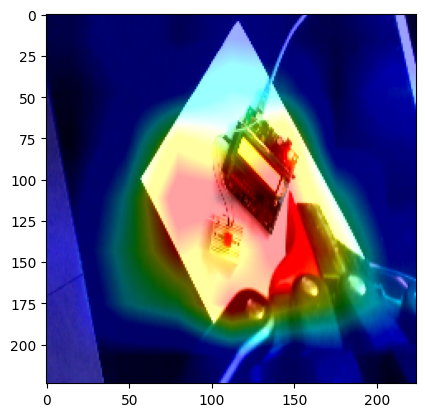

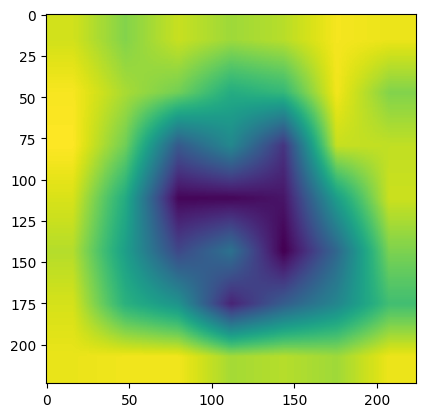

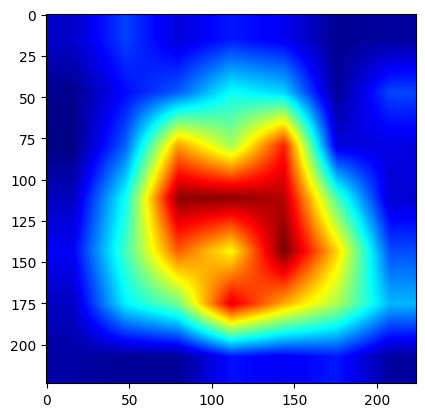

In [54]:
import matplotlib.pyplot as plt
# used_images shape: [1, n_obs, C, H, W]
# attn_maps shape: [1,n_obs, K, H’, W’]

attn = attn_maps[0][0].cpu().numpy().shape   # shape (K, H, W) (2, 32 , 7 , 7)
for attention_map in  attn_maps[0][0]:
    image, overlay, heat_gray, heat_color = overlay_all_keypoints(img, attn_maps[0][0][i],0.7)
    plt.imshow(image)
    plt.show()
    plt.imshow(overlay)
    plt.show()
    plt.imshow(heat_gray)
    plt.show()
    plt.imshow(heat_color)
    plt.show()


# lerobot dataset

In [ ]:
from lerobot.common.datasets.lerobot_dataset import LeRobotDataset


dataset = LeRobotDataset(repo_id="", root="/home/rtalwar/robot-imitation-glue/datasets/delta_z")

episode_indices = dataset.episode_data_index
episode_idx = 0
start_idx = episode_indices["from"][episode_idx].item()
end_idx = episode_indices["to"][episode_idx].item()

# reset to clear action buffers for chunking agents

frame = dataset[start_idx]

# # --- Loop through frames in episode ---
for idx in range(start_idx, end_idx):
    frame = dataset[idx]
    action = frame["action"].cpu().numpy()
    actions.append(action)

0.001094679
0.0003485336
0.0010059202
0.0015968317
0.0032747213
0.0059992024
0.008953738
0.008664744
0.011310124
0.008915696
0.0068138307
0.00689293
0.0034380252
0.0014804014
0.0010254466
0.004267157
0.0065340544
0.0056580286
0.004119461
0.0027128786
0.0040848674
0.0046998924
0.0028510576
0.001515609
0.0011415385
-0.0002874487
-0.00062129775
-0.0019143437
-0.0020633389
-0.0042218184
-0.004602184
-0.010248363
-0.012676981
-0.011623705
-0.014551734
-0.015475233
-0.015712246
-0.0144431945
-0.019572815
-0.016729077
-0.019435626
-0.015596338
-0.011187457
-0.0059167785
-0.002007979
-0.00022826364


: 

In [11]:
frame.keys()

dict_keys(['wrist_image_original', 'wrist_image', 'spectogram_image', 'next.reward', 'next.success', 'seed', 'timestamp', 'state', 'robot_pose', 'gripper_state', 'joints', 'ft', 'btn_state', 'action', 'frame_index', 'episode_index', 'index', 'task_index', 'task'])

In [12]:
frame["action"]

tensor(0.0011)

# Spectogram

Resolving data files:   0%|          | 0/34 [00:00<?, ?it/s]

torch.Size([298, 128])


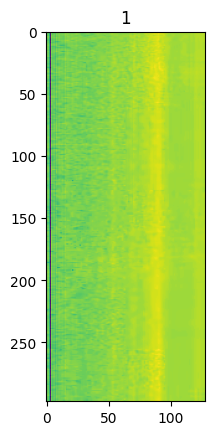

torch.Size([298, 128])


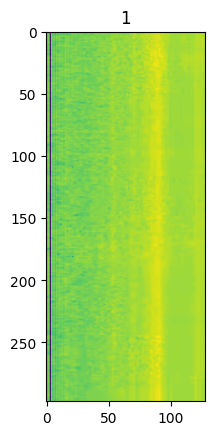

torch.Size([298, 128])


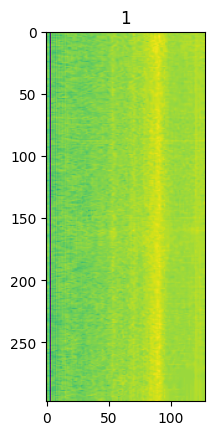

torch.Size([298, 128])


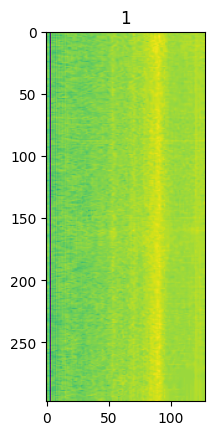

torch.Size([298, 128])


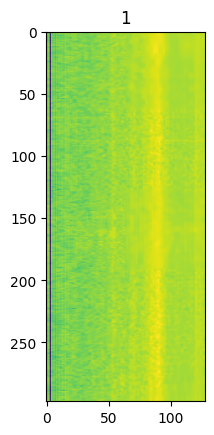

torch.Size([298, 128])


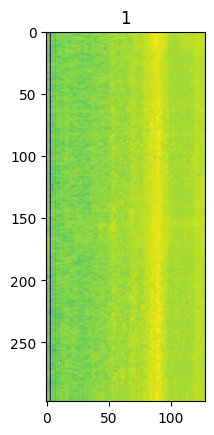

torch.Size([298, 128])


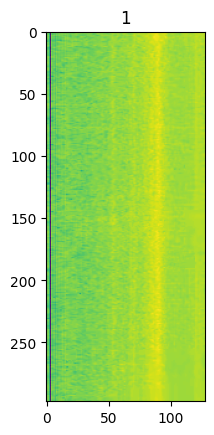

torch.Size([298, 128])


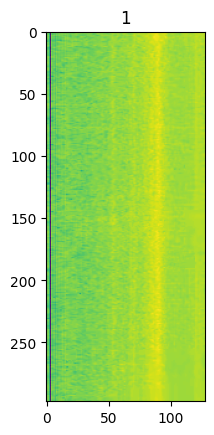

torch.Size([298, 128])


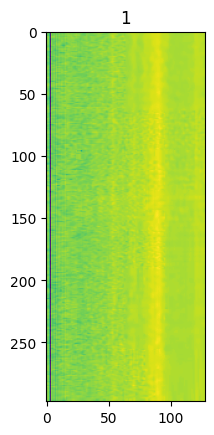

torch.Size([298, 128])


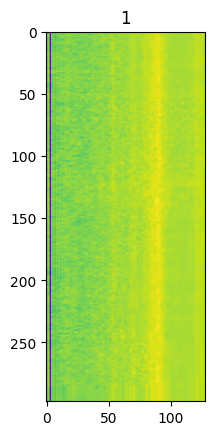

torch.Size([298, 128])


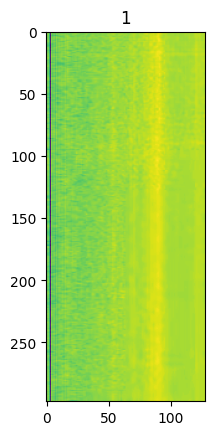

torch.Size([298, 128])


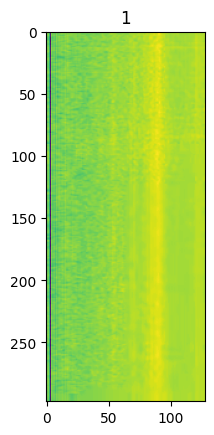

torch.Size([298, 128])


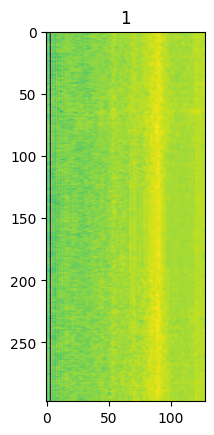

torch.Size([298, 128])


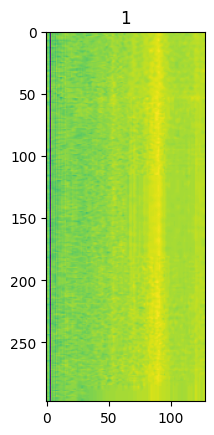

torch.Size([298, 128])


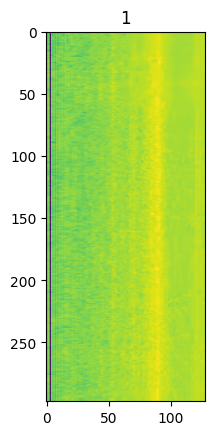

torch.Size([298, 128])


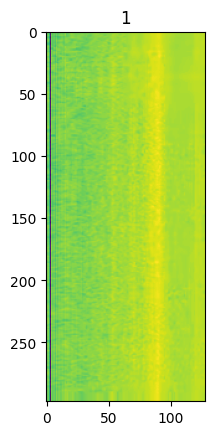

torch.Size([298, 128])


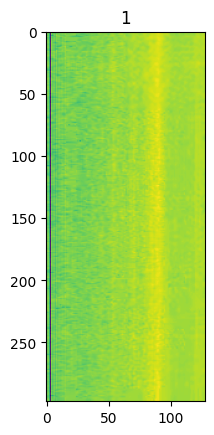

torch.Size([298, 128])


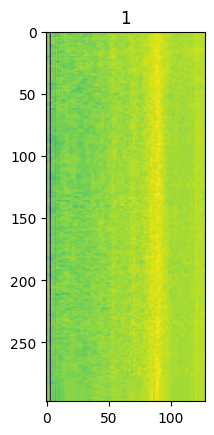

torch.Size([298, 128])


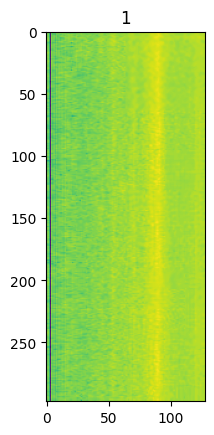

torch.Size([298, 128])


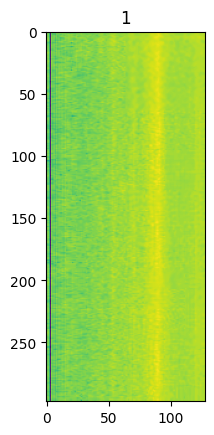

torch.Size([298, 128])


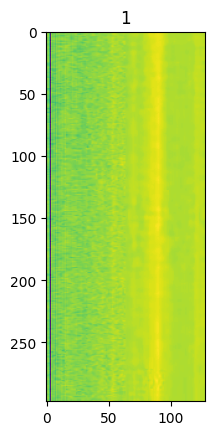

torch.Size([298, 128])


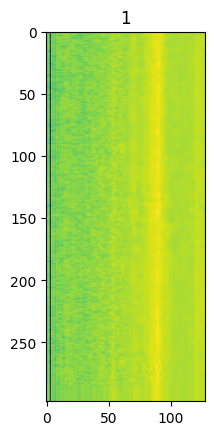

torch.Size([298, 128])


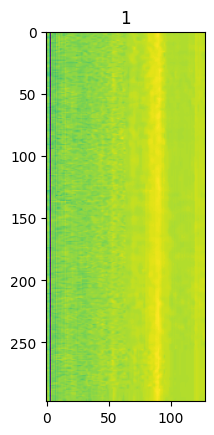

torch.Size([298, 128])


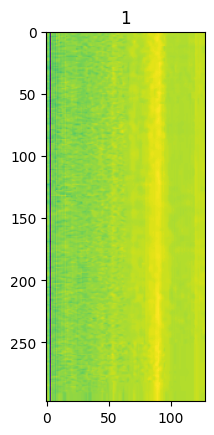

torch.Size([298, 128])


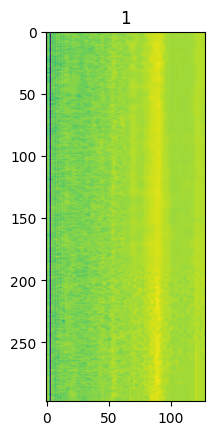

torch.Size([298, 128])


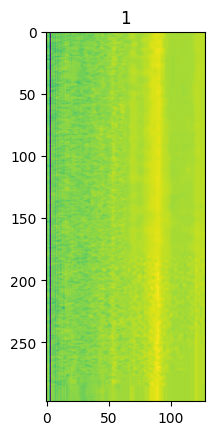

torch.Size([298, 128])


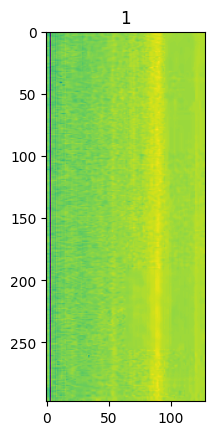

torch.Size([298, 128])


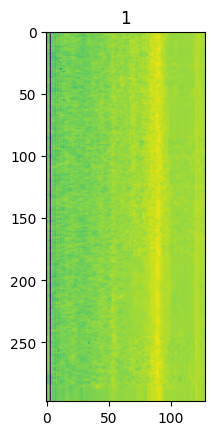

torch.Size([298, 128])


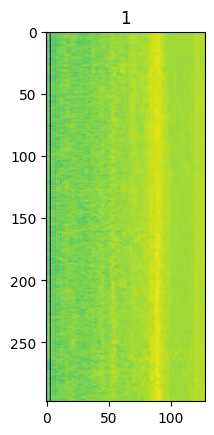

torch.Size([298, 128])


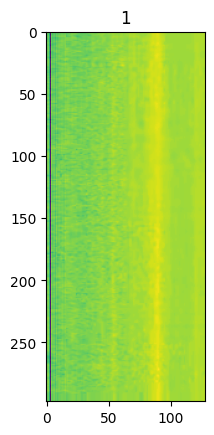

torch.Size([298, 128])


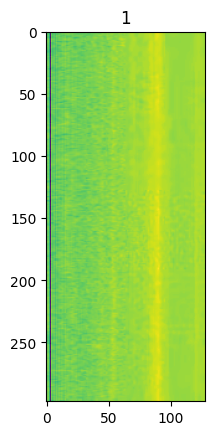

torch.Size([298, 128])


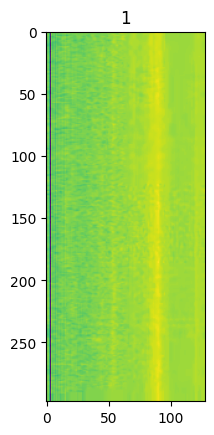

torch.Size([298, 128])


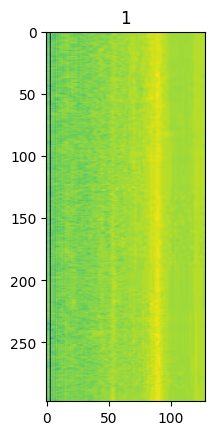

torch.Size([298, 128])


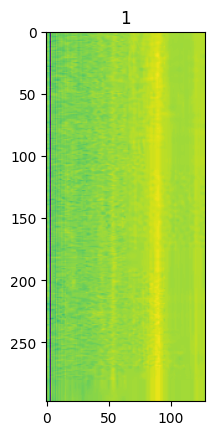

torch.Size([298, 128])


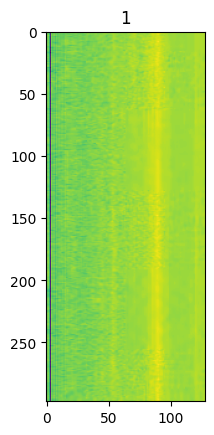

torch.Size([298, 128])


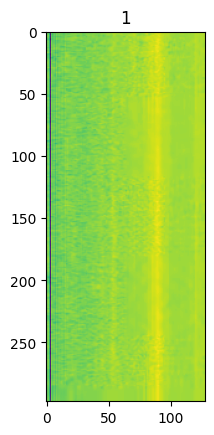

torch.Size([298, 128])


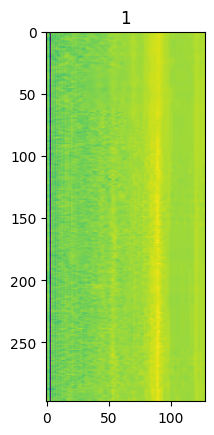

torch.Size([298, 128])


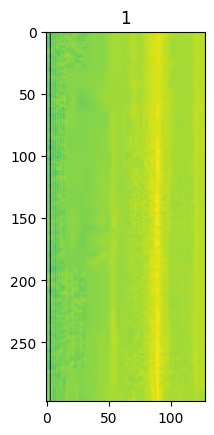

torch.Size([298, 128])


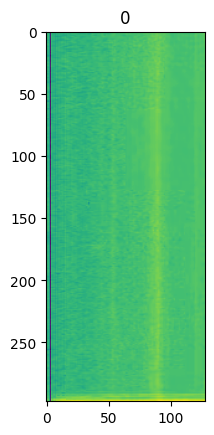

torch.Size([298, 128])


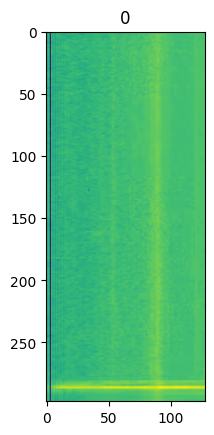

torch.Size([298, 128])


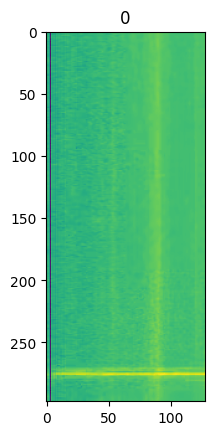

torch.Size([298, 128])


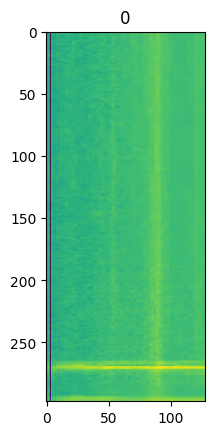

torch.Size([298, 128])


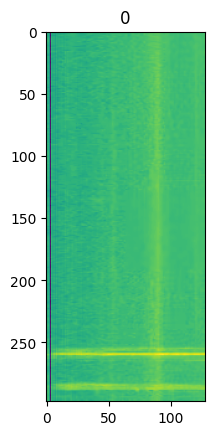

torch.Size([298, 128])


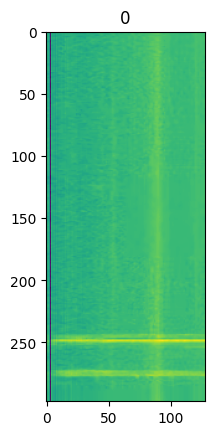

torch.Size([298, 128])


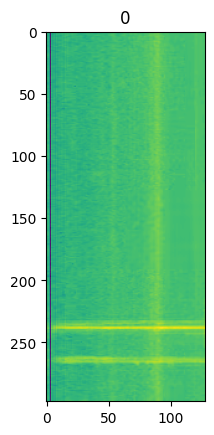

torch.Size([298, 128])


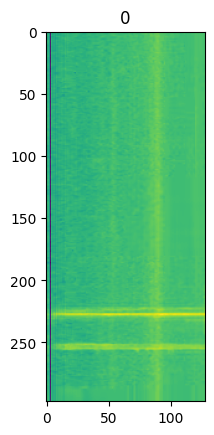

torch.Size([298, 128])


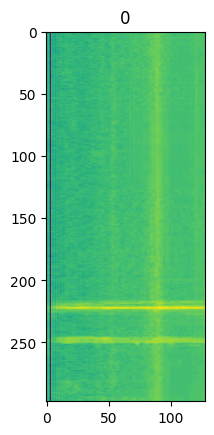

torch.Size([298, 128])


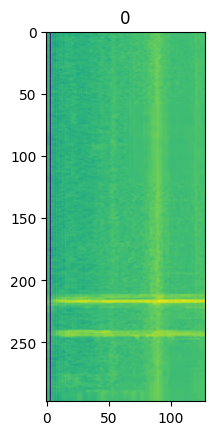

torch.Size([298, 128])


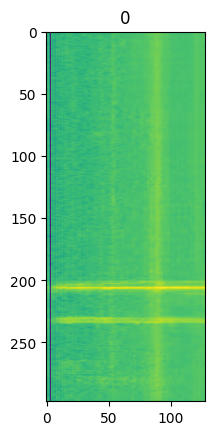

torch.Size([298, 128])


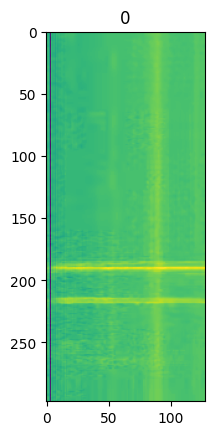

torch.Size([298, 128])


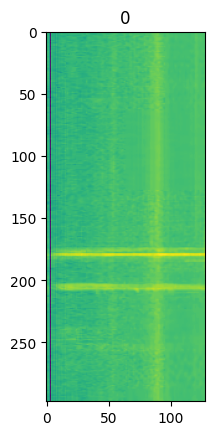

torch.Size([298, 128])


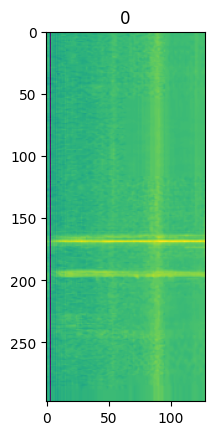

torch.Size([298, 128])


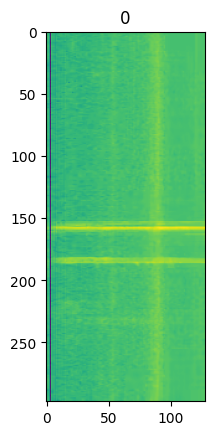

torch.Size([298, 128])


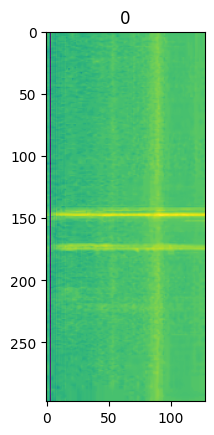

torch.Size([298, 128])


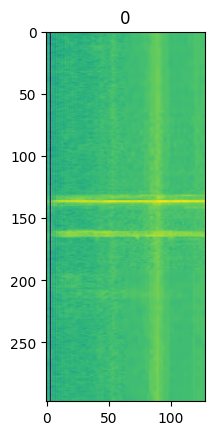

torch.Size([298, 128])


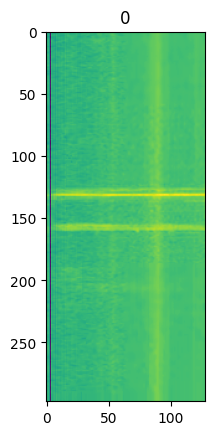

torch.Size([298, 128])


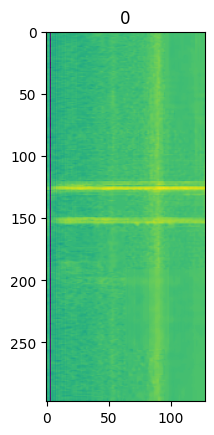

torch.Size([298, 128])


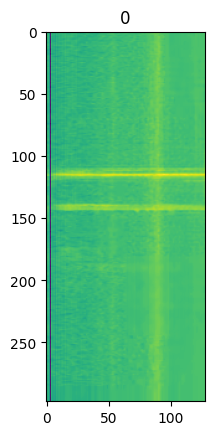

torch.Size([298, 128])


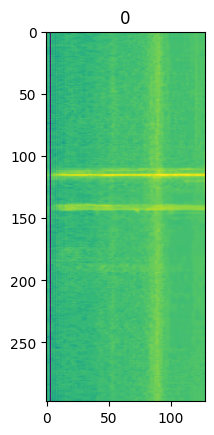

torch.Size([298, 128])


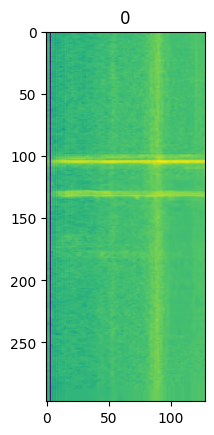

torch.Size([298, 128])


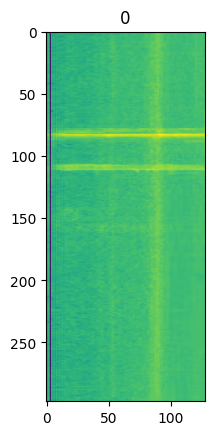

torch.Size([298, 128])


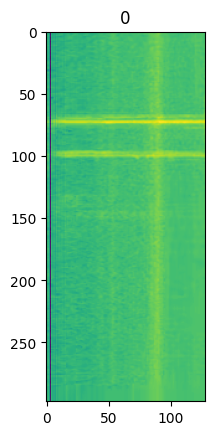

torch.Size([298, 128])


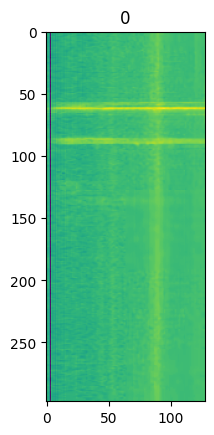

torch.Size([298, 128])


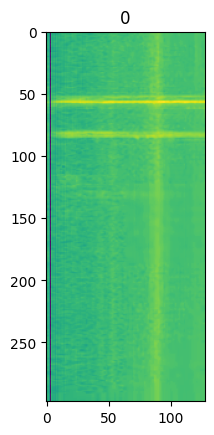

torch.Size([298, 128])


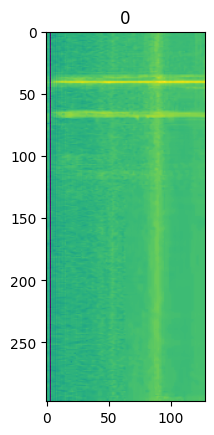

torch.Size([298, 128])


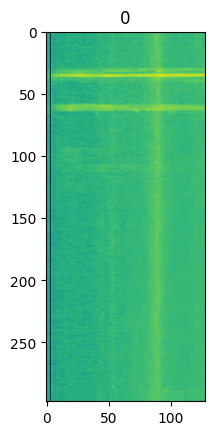

torch.Size([298, 128])


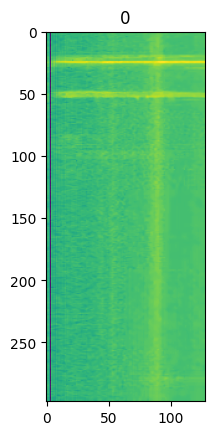

torch.Size([298, 128])


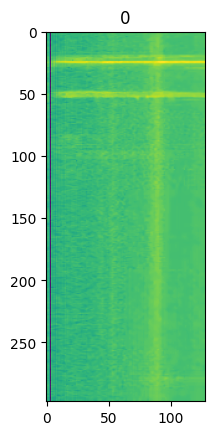

torch.Size([298, 128])


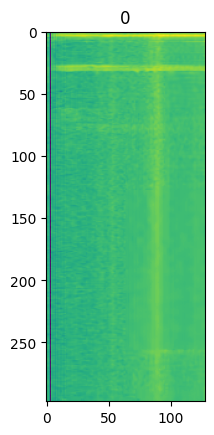

torch.Size([298, 128])


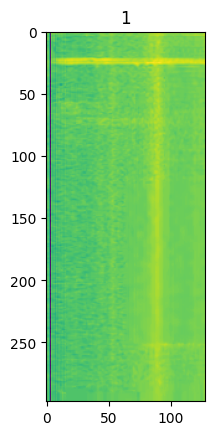

torch.Size([298, 128])


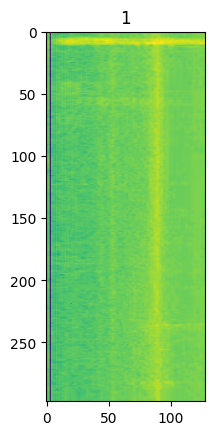

torch.Size([298, 128])


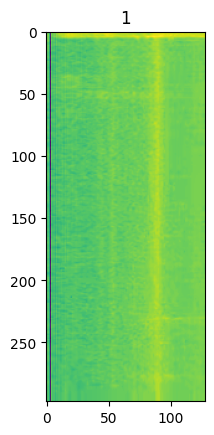

torch.Size([298, 128])


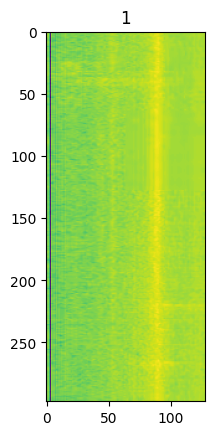

torch.Size([298, 128])


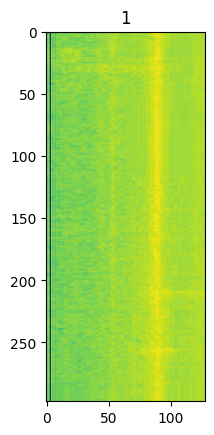

torch.Size([298, 128])


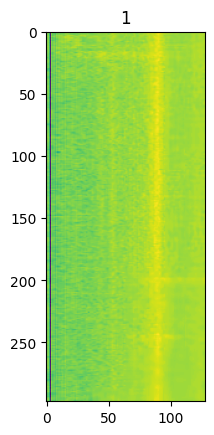

torch.Size([298, 128])


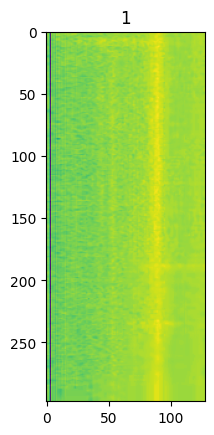

torch.Size([298, 128])


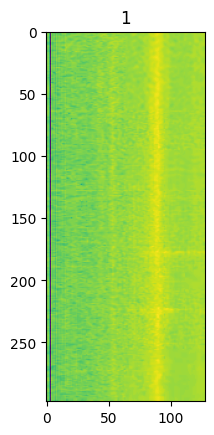

torch.Size([298, 128])


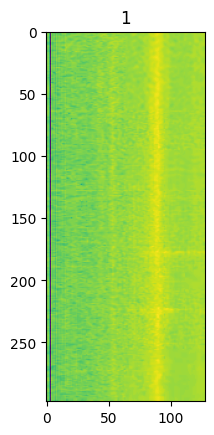

torch.Size([298, 128])


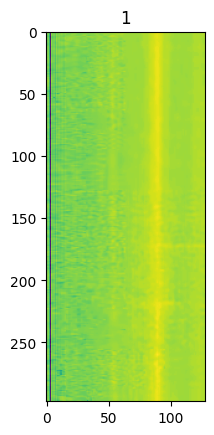

torch.Size([298, 128])


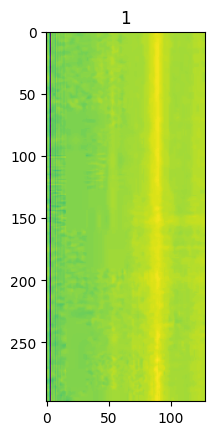

torch.Size([298, 128])


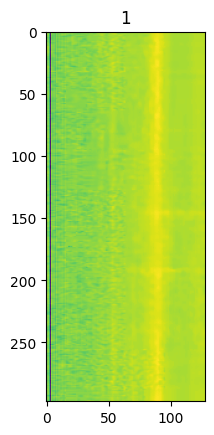

torch.Size([298, 128])


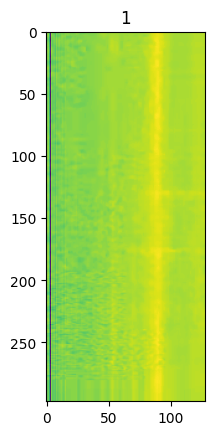

torch.Size([298, 128])


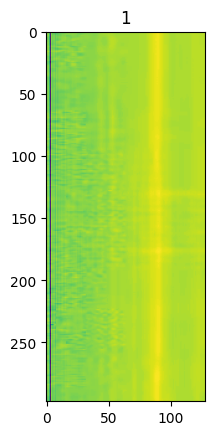

replay finished


In [ ]:
from lerobot.common.datasets.lerobot_dataset import LeRobotDataset
import matplotlib.pyplot as plt
dataset = LeRobotDataset(repo_id="", root="/home/rtalwar/robot-imitation-glue/datasets/delta_z_spectogram_rgb_instumentation")
n_episodes = len(dataset.episode_data_index["from"])

for episode_idx in range(0,n_episodes):
    episode_indices = dataset.episode_data_index
    episode_start_idx = episode_indices["from"][episode_idx].item()
    episode_to_idx = episode_indices["to"][episode_idx].item()
    label=1
    clickframe=episode_to_idx
    for i in range(episode_start_idx, episode_to_idx):
        frame=dataset[i]
        spectogram_values = frame["observation.images.spectogram_values"][0,:,:]
        print(spectogram_values.shape)
        
        if frame["btn_state"]==0:
            label=0
            clickframe = i
        if i ==clickframe+30: #30 frames = 300ms after click it should not be visible anymore
            label=1
        plt.imshow(spectogram_values)
        plt.title(label)
        plt.show()

print("replay finished")

# autolabel

In [1]:
from datasets import Dataset
from datasets import DatasetInfo
class SpectrogramDataset:
    def __init__(self, spectrograms, labels, mean=None, std=None):
        """
        spectrograms: List or Array of shape (N, Time, Freq=128)
        labels: List or Array of shape (N,)
        """
        self.spectrograms = spectrograms
        self.labels = labels
        
        # AST Normalization (Crucial step from the paper)
        # If mean/std are not provided, calculate them (like get_norm_stats.py)
        if mean is None or std is None:
            self.mean = np.mean(spectrograms)
            self.std = np.std(spectrograms)
        else:
            self.mean = mean
            self.std = std

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        spec = self.spectrograms[idx]
        
        # 1. Normalize: (input - mean) / (std * 2) 
        # The *2 is specific to the AST paper to bring data roughly between -0.5 and 0.5
        norm_spec = (spec - self.mean) / (self.std * 2)
        
        # 2. Convert to Tensor
        norm_spec = torch.tensor(norm_spec, dtype=torch.float32)
        
        # 3. Transpose if necessary? 
        # HuggingFace AST expects (Batch, Time, Freq). 
        # Your kaldi.fbank likely outputs (Time, Freq), which is correct.
        
        return {"input_values": norm_spec, "labels": self.labels[idx]}

    # Helper to convert to HF Dataset
    def create_hf_dataset(self):
        # norm_specs = [(s - self.mean) / (self.std * 2) for s in self.spectrograms]
        info = DatasetInfo(
            description=f"Spectrogram dataset mean {self.mean} , std: {self.std}"
        )
        ds = Dataset.from_dict({
            "input_values": self.spectrograms,
            "label": self.labels,
        },info=info)



        return ds

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from lerobot.datasets.lerobot_dataset import LeRobotDataset
from IPython.display import clear_output

# 1. Setup
# ---------------------------------------------------------
repo_id = "" # Update this if needed (or keep empty if local)
local_root = "/home/rtalwar/robot-imitation-glue/datasets/delta_xyz_final_rgb_audio"
# Target repo to save the new dataset (can be same as source if you have write access)
target_repo_id = "ramen-noodels/delta_xyz_train_spectrogram_labeled_unnormalized" 

dataset = LeRobotDataset(repo_id=repo_id, root=local_root)
n_episodes = dataset.meta.total_episodes

# This list will hold the final labels for the entire dataset
all_labels = [0] * len(dataset)

# 2. Generate Heuristic Labels
# ---------------------------------------------------------
print("Generating heuristic labels...")
for episode_idx in range(n_episodes):
    # Get indices for this episode
    episode_indices = dataset.meta.episodes[episode_idx]
    episode_start_idx = episode_indices["dataset_from_index"]
    episode_to_idx = episode_indices["dataset_to_index"]
    
    # Default state for start of episode
    current_label = 1 
    click_frame_idx = -1 
    
    # Iterate through this specific episode
    for i in range(episode_start_idx, episode_to_idx):
        frame = dataset[i]
        
        # YOUR HEURISTIC LOGIC
        # --------------------
        # Logic: Label is 1 (visible/default). 
        # If btn pressed (0), label becomes 0 (not visible/clicked).
        # 30 frames later, it becomes 1 again.
        
        if frame["btn_state"] == 0:
            current_label = 0
            click_frame_idx = i
        
        if click_frame_idx != -1 and i >= click_frame_idx + 30:
            current_label = 1
            # Reset click frame so we don't trigger this immediately again 
            # unless button is pressed again
            click_frame_idx = -1 

        all_labels[i] = current_label

print("Heuristic labels generated.")

# 3. Interactive Verification
# ---------------------------------------------------------
def plot_transition(center_idx, labels, dataset):
    """Plots 4 frames before and 4 after the center index."""
    # Define window (handle dataset boundaries)
    start = max(0, center_idx - 4)
    end = min(len(dataset), center_idx + 5) # +5 because range is exclusive at end
    
    indices = list(range(start, end))
    num_frames = len(indices)
    
    fig, axes = plt.subplots(1, num_frames, figsize=(20, 3))
    
    for ax_idx, ds_idx in enumerate(indices):
        frame = dataset[ds_idx]
        # [C, H, W] -> [H, W]
        spectrogram = frame["observation.audio.spectogram_values"][0, :, :]
        
        ax = axes[ax_idx]
        ax.imshow(spectrogram, aspect='auto')
        
        # Color code title: Red if label changed relative to previous frame
        is_transition = (ds_idx > 0 and labels[ds_idx] != labels[ds_idx-1])
        title_color = 'red' if is_transition else 'black'
        
        ax.set_title(f"Idx: {ds_idx}\nLbl: {labels[ds_idx]}", color=title_color)
        ax.axis('off')
        
        # Highlight the center frame
        if ds_idx == center_idx:
            for spine in ax.spines.values():
                spine.set_edgecolor('blue')
                spine.set_linewidth(3)

    plt.tight_layout()
    plt.show() # Non-blocking so code continues to input
    return fig

# Find indices where label changes
transitions = []
for i in range(1, len(all_labels)):
    if all_labels[i] != all_labels[i-1]:
        transitions.append(i)

print(f"Found {len(transitions)} label transitions.")
print("Starting interactive verification...")

i = 0
while i < len(transitions):
    t_idx = transitions[i]
    print(f"\n--- Checking transition at index {t_idx} ({i+1}/{len(transitions)}) ---")
    print(f"Label went from {all_labels[t_idx-1]} to {all_labels[t_idx]}")
    
    fig = plot_transition(t_idx, all_labels, dataset)
    
    user_input = input(
        "[Enter]: Keep\n"
        "[num]: Shift transition to this index\n"
        "[f]: Flip label at this index\n"
        "[q]: Quit verification\n"
        "Selection: "
    )
    
    plt.close(fig) # Close plot
    plt.close('all')
    clear_output(wait=True)  # removes old outputs from the notebook
    
    if user_input.lower() == 'q':
        break
    elif user_input == '':
        i += 1
        continue
    elif user_input.lower() == 'f':
        # Flip current label
        all_labels[t_idx] = 1 - all_labels[t_idx]
        print(f"Label at {t_idx} flipped to {all_labels[t_idx]}")
        # Don't increment 'i' so we can verify the change immediately
    elif user_input.isdigit():
        new_idx = int(user_input)
        # Shift logic: If user says transition is actually at 50, but we found it at 48.
        # We need to fill the gap with the 'previous' label.
        
        # Determine which label is the "pre-transition" label
        target_val = all_labels[t_idx] # The value it changed TO
        prev_val = all_labels[t_idx-1] # The value it changed FROM
        
        # Apply corrections
        # This is a simplified logic: it forces a split at the new index
        # You might need to adjust logic depending on if you are shifting left or right
        if new_idx > t_idx:
            # Shift transition RIGHT: indices between t_idx and new_idx become prev_val
            for k in range(t_idx, new_idx):
                all_labels[k] = prev_val
        elif new_idx < t_idx:
            # Shift transition LEFT: indices between new_idx and t_idx become target_val
            for k in range(new_idx, t_idx):
                all_labels[k] = target_val
        
        print(f"Transition shifted to {new_idx}")
        # Update transition list for future iterations if necessary, 
        # or just re-verify this section
        if new_idx not in transitions:
            transitions[i] = new_idx 
            # We stay at 'i' to verify the new look
    else:
        print("Invalid input, skipping.")
        i += 1

# 4. Save to Hugging Face Hub
# ---------------------------------------------------------
print("\nPreparing to save...")

# # Get the underlying Hugging Face dataset object
# hf_dataset = dataset.hf_dataset

# # Add the new labels as a column
# # We remove the column if it exists to overwrite, or just add it
# if "observation.labels" in hf_dataset.column_names:
#     hf_dataset = hf_dataset.remove_columns("observation.labels")

# # Add the new column
# hf_dataset = hf_dataset.add_column("observation.labels", all_labels)

# # Push to hub
# print(f"Pushing to {target_repo_id}...")
# hf_dataset.push_to_hub(target_repo_id)

# print("Done! Dataset saved.")
spectograms=[dataset[i]["observation.audio.spectogram_values"][0,:,:] for i in range(0,len(dataset))] 
spec_ds=SpectrogramDataset(spectograms,all_labels)
spec_ds_hf = spec_ds.create_hf_dataset()
spec_ds_hf.push_to_hub(target_repo_id)


Preparing to save...


Uploading the dataset shards:   0%|          | 0/4 [00:00<?, ? shards/s]

Creating parquet from Arrow format:   0%|          | 0/5 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Creating parquet from Arrow format:   0%|          | 0/5 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Creating parquet from Arrow format:   0%|          | 0/5 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Creating parquet from Arrow format:   0%|          | 0/5 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

README.md:   0%|          | 0.00/336 [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/datasets/ramen-noodels/delta_xyz_train_spectrogram_labeled_unnormalized/commit/e604a631ef09967bbce10f88fd855100c4e07961', commit_message='Upload dataset', commit_description='', oid='e604a631ef09967bbce10f88fd855100c4e07961', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/ramen-noodels/delta_xyz_train_spectrogram_labeled_unnormalized', endpoint='https://huggingface.co', repo_type='dataset', repo_id='ramen-noodels/delta_xyz_train_spectrogram_labeled_unnormalized'), pr_revision=None, pr_num=None)

In [17]:
from datasets import load_dataset
train_ds = load_dataset("ramen-noodels/delta_z_spectrogram_labeled_fixeddz")


README.md:   0%|          | 0.00/332 [00:00<?, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/88.5M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3047 [00:00<?, ? examples/s]

In [33]:
local_root = "/home/rtalwar/robot-imitation-glue/datasets/delta_z_spectogram_rgb_instumentation"
dataset = LeRobotDataset(repo_id=repo_id, root=local_root)

Resolving data files:   0%|          | 0/34 [00:00<?, ?it/s]

In [34]:
spectograms=[dataset[i]["observation.images.spectogram_values"][0,:,:] for i in range(0,len(dataset))] 
spec_ds=SpectrogramDataset(spectograms,train_ds["train"]["label"])
spec_ds_hf = spec_ds.create_hf_dataset()
spec_ds_hf.push_to_hub("ramen-noodels/delta_z_train_spectrogram_labeled_unnormalized")

Uploading the dataset shards:   0%|          | 0/1 [00:00<?, ? shards/s]

Creating parquet from Arrow format:   0%|          | 0/5 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

CommitInfo(commit_url='https://huggingface.co/datasets/ramen-noodels/delta_z_train_spectrogram_labeled_unnormalized/commit/7dfa212e20da38686efff918b133ee42e0c65574', commit_message='Upload dataset', commit_description='', oid='7dfa212e20da38686efff918b133ee42e0c65574', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/ramen-noodels/delta_z_train_spectrogram_labeled_unnormalized', endpoint='https://huggingface.co', repo_type='dataset', repo_id='ramen-noodels/delta_z_train_spectrogram_labeled_unnormalized'), pr_revision=None, pr_num=None)

## analyze episodes that are longer down than neccecary

In [3]:
from lerobot.common.datasets.lerobot_dataset import LeRobotDataset


dataset = LeRobotDataset(repo_id="", root="/home/rtalwar/robot-imitation-glue/datasets/delta_z_automated_final2_dynamic")

episode_indices = dataset.episode_data_index
n_episodes = len(dataset.episode_data_index["from"])

for episode_idx in range(n_episodes):
    start_idx = episode_indices["from"][episode_idx].item()
    end_idx = episode_indices["to"][episode_idx].item()

    # reset to clear action buffers for chunking agents


    # # --- Loop through frames in episode ---
    click_frame_idx=-1
    nr_actions_down = 0
    for idx in range(start_idx, end_idx):
        frame = dataset[idx]
        action = frame["action"].cpu().numpy()
        if frame["btn_state"] == 0:
            click_frame_idx = idx
            #count how many actions we need
            if action>0:
                nr_actions_down+=1 #neg is going up pos is going down, we want to see how many going down
    print(f'episodeidx {episode_idx} episodes going up: {nr_actions_down}')

Resolving data files:   0%|          | 0/51 [00:00<?, ?it/s]

episodeidx 0 episodes going up: 0
episodeidx 1 episodes going up: 0
episodeidx 2 episodes going up: 0
episodeidx 3 episodes going up: 0
episodeidx 4 episodes going up: 0
episodeidx 5 episodes going up: 0
episodeidx 6 episodes going up: 0
episodeidx 7 episodes going up: 0
episodeidx 8 episodes going up: 0
episodeidx 9 episodes going up: 0
episodeidx 10 episodes going up: 0
episodeidx 11 episodes going up: 0
episodeidx 12 episodes going up: 0
episodeidx 13 episodes going up: 0
episodeidx 14 episodes going up: 0
episodeidx 15 episodes going up: 0
episodeidx 16 episodes going up: 0
episodeidx 17 episodes going up: 0
episodeidx 18 episodes going up: 0
episodeidx 19 episodes going up: 0
episodeidx 20 episodes going up: 0
episodeidx 21 episodes going up: 0
episodeidx 22 episodes going up: 0
episodeidx 23 episodes going up: 0
episodeidx 24 episodes going up: 0
episodeidx 25 episodes going up: 0
episodeidx 26 episodes going up: 0
episodeidx 27 episodes going up: 0
episodeidx 28 episodes going u

### analyze episodes with no button click

In [ ]:
from lerobot.common.datasets.lerobot_dataset import LeRobotDataset


dataset = LeRobotDataset(repo_id="", root="/home/rtalwar/robot-imitation-glue/datasets/delta_xyz_final")

episode_indices = dataset.episode_data_index
n_episodes = len(dataset.episode_data_index["from"])

for episode_idx in range(n_episodes):
    start_idx = episode_indices["from"][episode_idx].item()
    end_idx = episode_indices["to"][episode_idx].item()
    # # --- Loop through frames in episode ---
    click_frame_idx=-1
    for idx in range(start_idx, end_idx):
        frame = dataset[idx]
        if frame["btn_state"] == 0:
            click_frame_idx = idx  
    if click_frame_idx == -1:
        print(f'episodeidx {episode_idx} had no clikc')
    else:
        print(f'episodeidx {episode_idx} had click on frame {idx}')


Resolving data files:   0%|          | 0/101 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

### compare rollout button state action and predicted button states

Resolving data files:   0%|          | 0/43 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

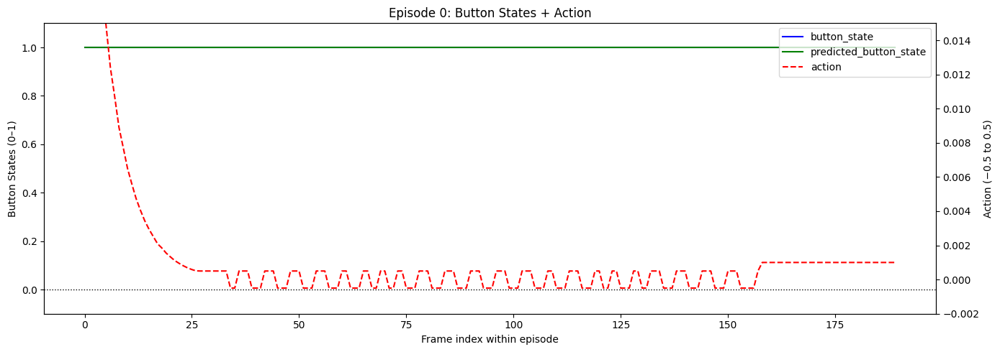

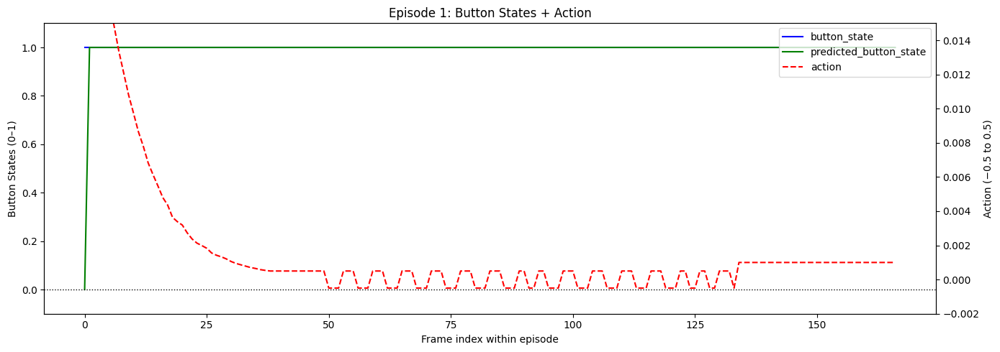

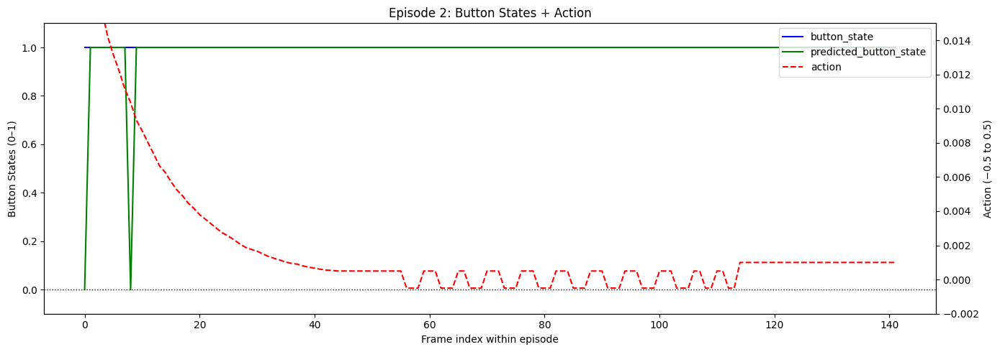

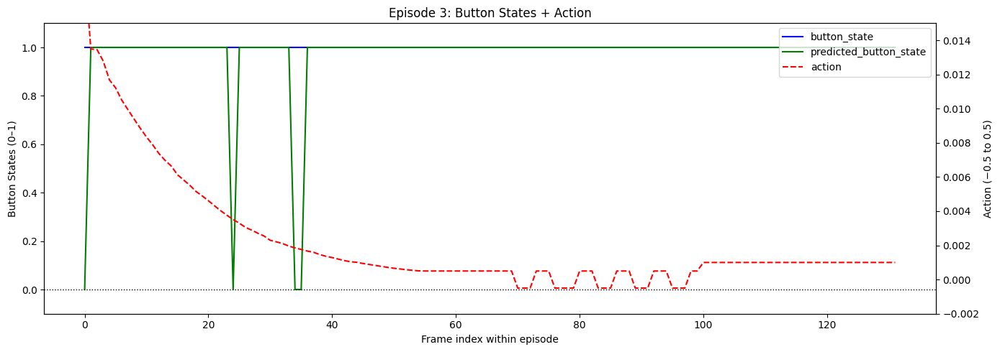

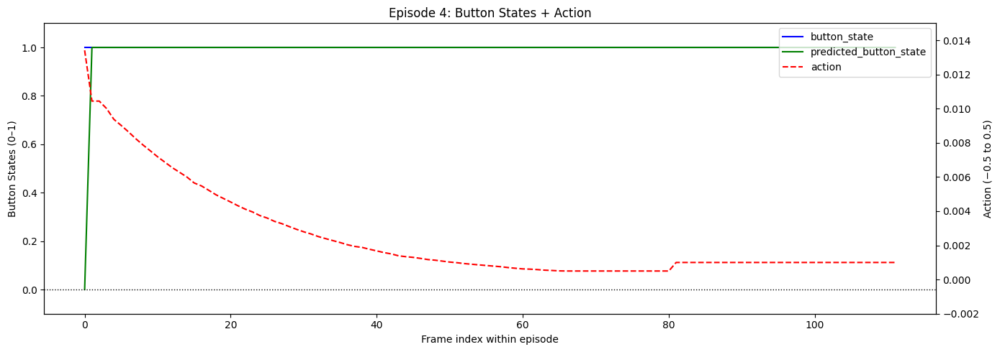

...

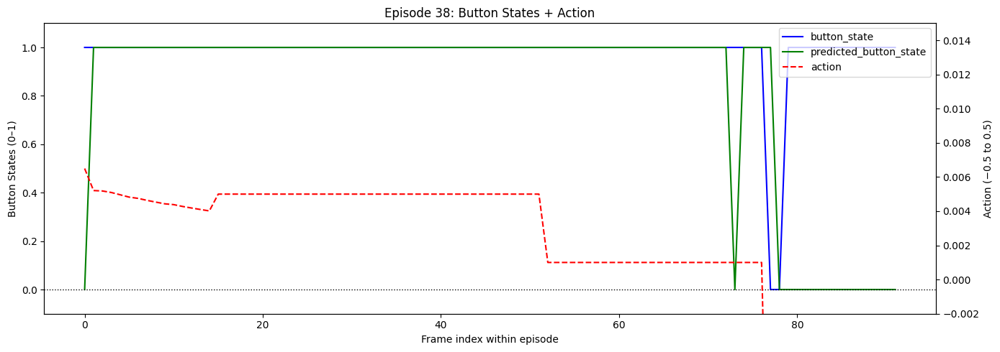

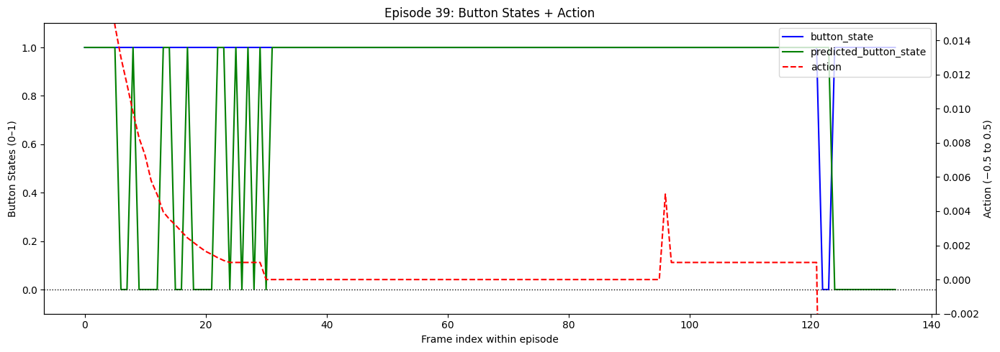

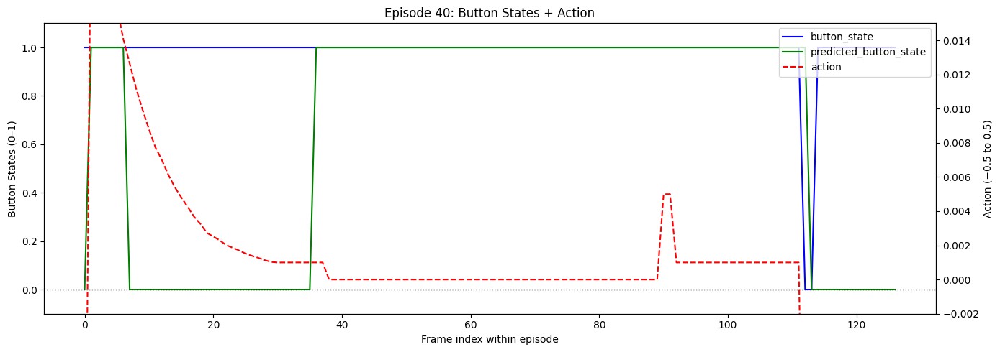

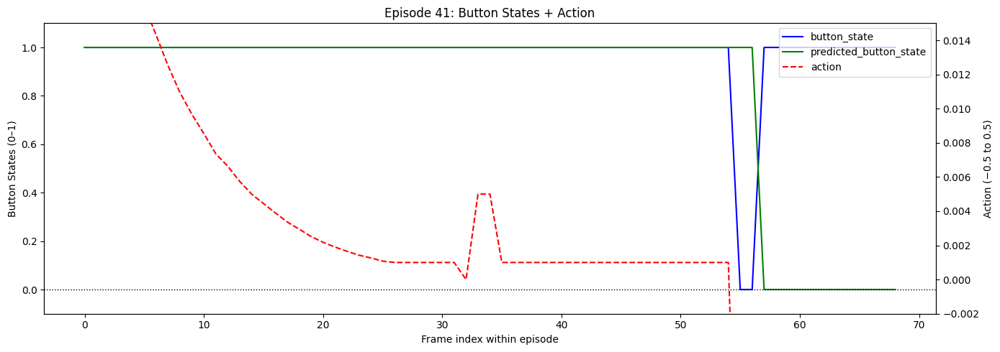

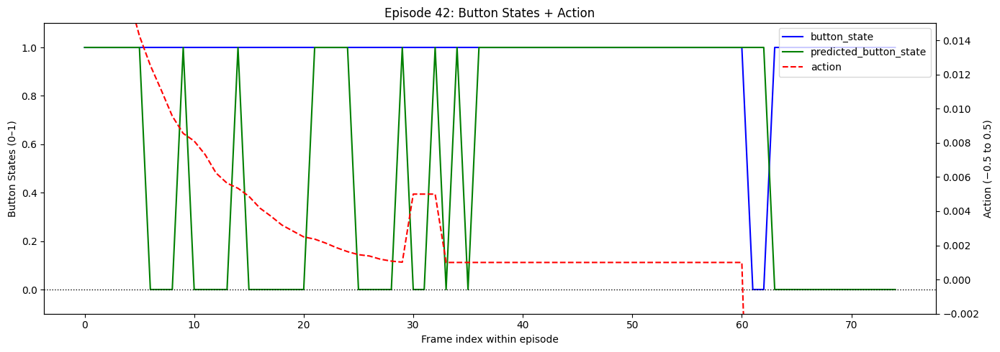

In [1]:
import matplotlib.pyplot as plt
import numpy as np

from lerobot.common.datasets.lerobot_dataset import LeRobotDataset

dataset = LeRobotDataset(
    repo_id="",
    root="/home/rtalwar/robot-imitation-glue/datasets/delta_xyz_final"
)

episode_indices = dataset.episode_data_index
n_episodes = len(episode_indices["from"])

for episode_idx in range(n_episodes):
    start_idx = episode_indices["from"][episode_idx].item()
    end_idx = episode_indices["to"][episode_idx].item()

    button_states = []
    predicted_button_states = []
    actions = []

    for idx in range(start_idx, end_idx):
        frame = dataset[idx]

        button_states.append(frame["btn_state"])
        predicted_button_states.append(frame["pred_button_state"])
        actions.append(frame["action"].cpu().numpy()[-1])   # scalar

    button_states = np.array(button_states)
    predicted_button_states = np.array(predicted_button_states)
    actions = np.array(actions).squeeze()

    # --------- PLOT ---------
    fig, ax1 = plt.subplots(figsize=(14, 5))

    # Primary axis: button states
    ax1.plot(button_states, label="button_state", color="blue")
    ax1.plot(predicted_button_states, label="predicted_button_state", color="green")
    ax1.set_ylim(-0.1, 1.1)
    ax1.set_ylabel("Button States (0–1)")
    ax1.set_xlabel("Frame index within episode")

    # Secondary axis: actions
    ax2 = ax1.twinx()
    ax2.plot(actions, label="action", color="red", linestyle="--")
    ax2.set_ylim(-0.002, 0.015)
    ax2.set_ylabel("Action (−0.5 to 0.5)")

    # Add horizontal line at y = 0 (on the action axis)
    ax1.axhline(0, color="black", linewidth=1, linestyle=":")

    # Combine legends
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper right")

    plt.title(f"Episode {episode_idx}: Button States + Action")
    plt.grid(True, which="both", axis="x")
    plt.tight_layout()
    plt.show()


## UR5 overlay

In [1]:

import torch
import numpy as np
import rerun as rr
from robot_imitation_glue.agents.lerobot_agent import LerobotAgent, make_lerobot_policy_for_inference
import cv2
from robot_imitation_glue.ur5station.ur5_robot_env import UR5eStation
image_size=224

def preprocessor(obs_dict):
    spectogram_values_image = obs_dict["spectogram_values"]
    spectogram_image = obs_dict["spectogram_image"]
    wrist_image = obs_dict["wrist_image"]
    state = obs_dict["state"]
    button = obs_dict["btn_state"]
    # pred_button = obs_dict["pred_button_state"]
    # state = np.concatenate((state,button))
    state = np.zeros(button.shape,dtype=np.float32)
    resized_wrist_image = cv2.resize(np.array(wrist_image), (320, 240))
    resized_spectogram_image = cv2.resize(np.array(spectogram_image), (image_size, image_size))

    # state = torch.tensor(button).float().unsqueeze(0)
    # state = torch.tensor(pred_button).float().unsqueeze(0)
    state = torch.tensor(state).float().unsqueeze(0)
    spectogram_image = torch.tensor(resized_spectogram_image).float() / 255.0
    wrist_image = torch.tensor(resized_wrist_image).float() / 255.0
    spectogram_image = spectogram_image.permute(2, 0, 1)
    wrist_image = wrist_image.permute(2, 0, 1)
    spectogram_values_image = torch.tensor(spectogram_values_image)
    spectogram_values_image = spectogram_values_image.permute(2, 0, 1)
    
    # unsqueeze images
    spectogram_image = spectogram_image.unsqueeze(0) 
    wrist_image = wrist_image.unsqueeze(0)
    spectogram_values_image = spectogram_values_image.unsqueeze(0) 
    return {
        # "observation.images.spectogram_image": spectogram_image,
        "observation.audio.spectogram_values" : spectogram_values_image,
        "observation.images.wrist_image": wrist_image,
        "observation.state": state,
    }

if __name__ == "__main__":
    rr.init("robot_imitation_glue", spawn=True)
    checkpoint_path = "/home/rtalwar/robot-imitation-glue/outputs/ramen-noodels/red_round_button_small_audio_button"

    env = UR5eStation(with_instrumentation=True,with_spectogram_model=True)
    env.reset()
    observations = env.get_observations()
    policy, lerobnot_preprocessor, lerobot_postprocessor = make_lerobot_policy_for_inference(checkpoint_path)
    policy_agent = LerobotAgent(policy,lerobnot_preprocessor, lerobot_postprocessor, "cuda", preprocessor)
    vis_image = observations["wrist_image"]
    rr.log("scene", rr.Image(vis_image))

    action, used_images, attn_maps= policy_agent.get_action(observations)
    # log images in rerun n_observations is hardcoded to 2 so 2 images should be shown
    if used_images is not None:
        # used_images shape: [batch, n_obs_steps, C, H, W]
        # assuming batch size 1:
        obs_imgs = used_images[0]          # shape [2, C, H, W]


        for i, img in enumerate(obs_imgs):
            # convert tensor → numpy and reshape to HWC
            img = img.squeeze(0)  # remove batch dim -> [C, H, W]

            img_np = img.cpu().numpy().transpose(1, 2, 0)

            rr.log(f"prediction_inputs/obs_{i}/raw", rr.Image(img_np))


/home/rtalwar/robot-imitation-glue/lerobot/src/lerobot/policies/vqbet/vqbet_utils.py:1373: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled=False)
2026-05-04 14:02:02.351 | INFO     | robot_imitation_glue.ur5station.ur5_robot_env:__init__:84 - connecting to robot.


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


2026-05-04 14:02:03.125 | INFO     | airo_robots.manipulators.hardware.ur_rtde:get_model:128 - Detected UR robot model: UR5e with PolyScope version: 5.12.4.1101661
2026-05-04 14:02:03.125 | INFO     | robot_imitation_glue.ur5station.ur5_robot_env:__init__:88 - Creating wrist camera publisher.
2026-05-04 14:02:03.143 | INFO     | robot_imitation_glue.ur5station.ur5_robot_env:__init__:98 - Creating wrist camera subscriber.
2026-05-04 14:02:03.157 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:155 - Did not yet receive resolution message. Sleeping for 1s...
2026-05-04 14:02:04.158 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:155 - Did not yet receive resolution message. Sleeping for 1s...
2026-05-04 14:02:05.158 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:155 - Did not yet receive resolution message. Sleeping for 1s...
2026-05-04 14:02:06.159 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:155 - Did not yet receive resolu

Shared memory file wrist_rgb.timestamp.buffer_0 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.timestamp.buffer_1 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.timestamp.buffer_2 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.rgb.buffer_0 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.rgb.buffer_1 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.rgb.buffer_2 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.intrinsics.buffer_0 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.intrinsics.buffer_1 exists. Will unlink and re-create it.
Shared memory file wrist_rgb.intrinsics.buffer_2 exists. Will unlink and re-create it.


2026-05-04 14:02:08.160 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:155 - Did not yet receive resolution message. Sleeping for 1s...
2026-05-04 14:02:09.160 | INFO     | robot_imitation_glue.hardware.ipc_camera:__init__:155 - Did not yet receive resolution message. Sleeping for 1s...
2026-05-04 14:02:10.212 | INFO     | robot_imitation_glue.ur5station.ur5_robot_env:__init__:103 - creating FT subscriber
2026-05-04 14:02:10.214 | INFO     | robot_imitation_glue.ur5station.ur5_robot_env:__init__:107 - creating spectogram subscriber
2026-05-04 14:02:10.215 | INFO     | robot_imitation_glue.hardware.ipc_mic:__init__:98 - Subscribed to DDS topic: KaldiSpectrogram
2026-05-04 14:02:10.215 | INFO     | robot_imitation_glue.ur5station.ur5_robot_env:__init__:111 - creating button subscriber


Inference running on: cuda


Loading weights:   0%|          | 0/203 [00:00<?, ?it/s]

Model loaded successfully.
num images : 1
image features = {'observation.images.wrist_image': PolicyFeature(type=<FeatureType.VISUAL: 'VISUAL'>, shape=(3, 240, 320))}
global cond dim: 65
adding intermediate layer


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

ASTModel LOAD REPORT from: /home/rtalwar/robot-imitation-glue/outputs/ramen-noodels/ast_delta_xyz_button_click_detector
Key                         | Status     |  | 
----------------------------+------------+--+-
classifier.dense.weight     | UNEXPECTED |  | 
classifier.layernorm.weight | UNEXPECTED |  | 
classifier.dense.bias       | UNEXPECTED |  | 
classifier.layernorm.bias   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Audio Encoder (embedding) is TRAINING (End-to-End).
global cond dim after audio: 129
Loading weights from local directory


2026-05-04 14:02:14.065 | INFO     | robot_imitation_glue.agents.lerobot_agent:get_action:97 - Lerobot agent observation preprocessor took 0.49 ms
2026-05-04 14:02:14.599 | INFO     | robot_imitation_glue.agents.lerobot_agent:get_action:105 - Lerobot agent inference took 532.72 ms


In [2]:
preprocessed_obs = preprocessor(observations)
vis_image = preprocessed_obs["observation.images.wrist_image"]
live_img = vis_image
live_img_np = (
                live_img.squeeze(0)  # remove batch dim -> [3, 224, 224]
                .permute(1, 2, 0)  # to [224, 224, 3]
                .cpu()
                .numpy()
            )
rr.log(f"prediction_inputs/preprocessed", rr.Image(live_img_np))


In [3]:
import torch
import numpy as np
import cv2

def overlay_all_keypoints(image_tensor, attn_tensor, alpha=0.5):
    """
    image_tensor: (C, H, W) torch tensor, values 0–1 or 0–255
    attn_tensor:  (K, h, w) torch tensor, typically (32,7,7)
    alpha: overlay transparency
    """

    # Convert image to uint8
    image_tensor = image_tensor.squeeze(0) 
    image = image_tensor.permute(1, 2, 0).cpu().numpy()  # (H, W, C)
    # if image.max() <= 1.0:
    #     image = (image * 255).astype(np.uint8)
    # else:
    #     image = image.astype(np.uint8)

    H_img, W_img = image.shape[:2]

    # Upsample all heatmaps at once
    heat = 1-attn_tensor.unsqueeze(0)  # (1, K, 7, 7)
    # heat = attn_tens|or
    heat_upsampled = torch.nn.functional.interpolate(
        heat, size=(H_img, W_img), mode='bilinear', align_corners=False
    )[0]  # (K, H, W)

    # Combine all into one heatmap by summing
    combined = heat_upsampled.sum(dim=0).cpu().numpy()  # (H, W)

    # Normalize to 0–255
    combined_norm = (combined - combined.min()) / (combined.max() - combined.min() + 1e-6)
    combined_uint8 = (combined_norm * 255).astype(np.uint8)

    # Colorize using a heatmap (JET)
    combined_color = (cv2.applyColorMap(combined_uint8, cv2.COLORMAP_JET)/255.0).astype(np.float32)

    # Overlay the heatmap onto the RGB image
    overlay = cv2.addWeighted(image, 1 - alpha, combined_color, alpha, 0)

    return image,overlay, combined_uint8, combined_color


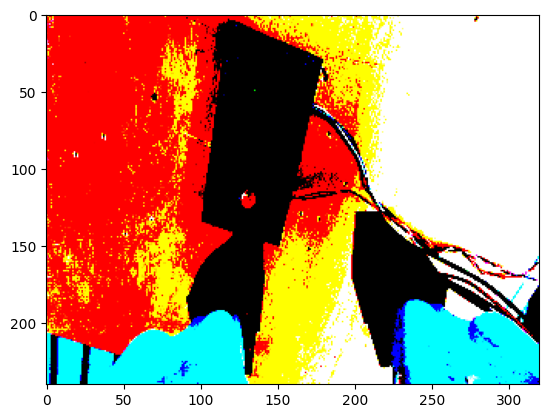

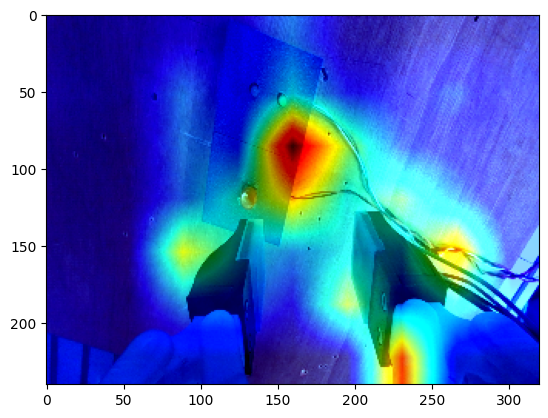

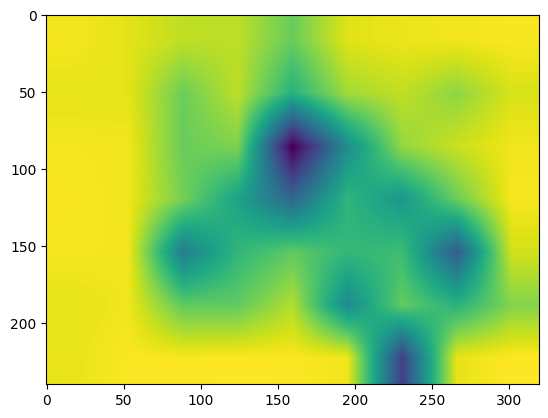

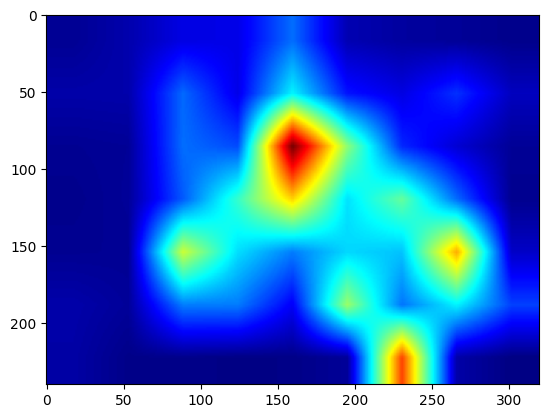

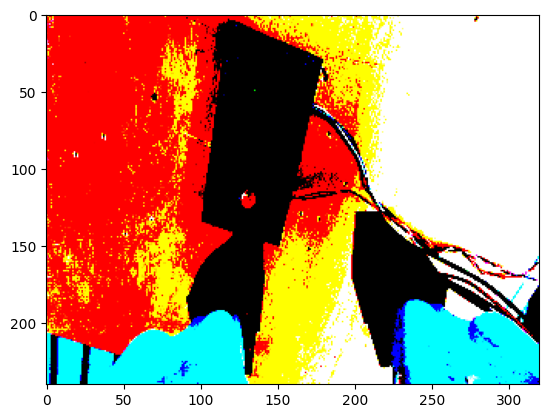

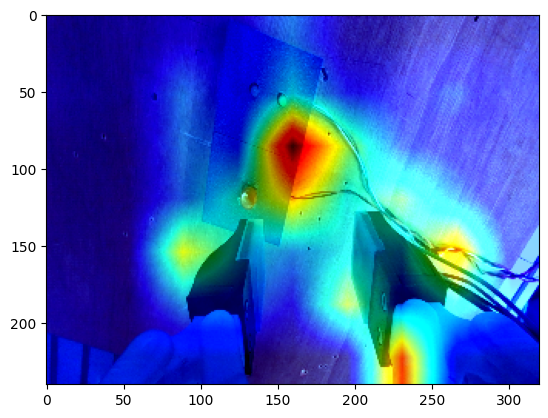

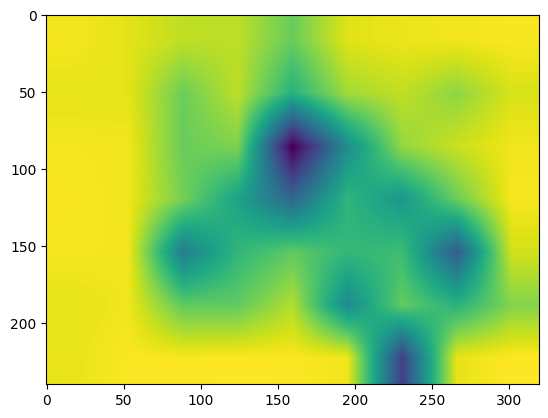

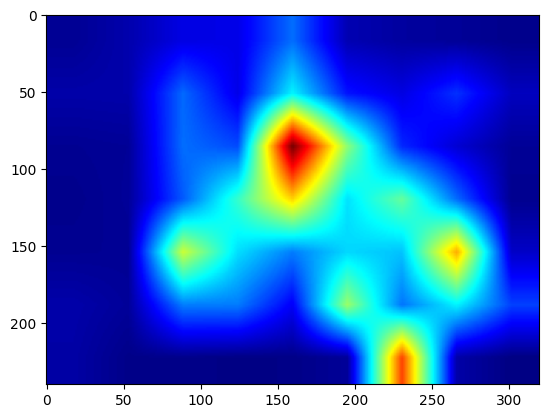

In [10]:
import matplotlib.pyplot as plt
# used_images shape: [1, n_obs, C, H, W]
# attn_maps shape: [1,n_obs, K, H’, W’]

attn = attn_maps[0][0].cpu().numpy().shape   # shape (K, H, W) (2, 32 , 7 , 7)
for attention_map in  attn_maps[0][0]:
    image, overlay, heat_gray, heat_color = overlay_all_keypoints(img, attn_maps[0][0][i],0.99)
    plt.imshow(image)
    plt.show()
    plt.imshow(overlay)
    plt.show()
    plt.imshow(heat_gray)
    plt.show()
    plt.imshow(heat_color)
    plt.show()


In [11]:
rr.log(f"prediction_inputs/obs_{i}/attention", rr.Image(overlay))
